<a href="https://colab.research.google.com/github/sangavivp/Machine-Learning-Projects/blob/master/OlympicsVSEconomy_EDA_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<center>
    <h1><b>EFFECT OF ECONOMY ON OLYMPICS MEDALS</b></h1>
</center>

**Table of Contents:**
    

  1.[Problem Statement and Background Information](#section1)<br>
         
  2.[Packages and Data Loading](#section2)<br>
       &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;2.1[Packages loading](#section21)<br>
       &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;2.2[Dataset Loading](#section22)<br>
       
  3.[Profiling and Processing](#section3)<br>
      &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;3.1[Profiling](#section31)<br>
      &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;3.2[Preprocessing Olympics related data](#section32)<br>
      &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;3.3[Processing the gdp_df](#section33)<br>
      
  4.[Data Visualization](#section4)<br>
      &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;4.1[Count Plot of the medals](#section41)<br>
      &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;4.2[Bar chart depicting the top countries](#section42)<br>
      &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;4.2.1[Extending Analysis for top countries, with change in economic cateogaries](#section421)<br>
      &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;4.3[Cateogary-wise pie charts](#section43)<br>
      &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;4.4[Cateogary-wise Medal count](#section44)<br>
      
  5.[Conclusions](#section5)<br>
  
  6.[Actionable Insights](#section6)<br>
      
      




   





<a id=section1></a>


<a id="section1"></a>



<b>1.PROBLEM STATEMENT:</b>To analyse the effect of economy (in terms of GDP) of a country in winning olympics medals. 

---



---


<center><b>**BACKGROUND INFORMATION**</b></center>

---



---



<b>Olympics :</b> The modern Olympic Games or Olympics (French: Jeux olympiques) are leading international sporting events featuring summer and winter sports competitions in which thousands of athletes from around the world participate in a variety of competitions. The Olympic Games are considered the world's foremost sports competition with more than 200 nations participating. The Olympic Games are held every four years, with the Summer and Winter Games alternating by occurring every four years but two years apart.


<b>Summer Olympics :</b>


* The Summer Olympic Games (French: Jeux olympiques d'été)or the Games of the Olympiad,is a quadrennial international multi-sport event.
* First held in 1896 - Next in 2020 at Japan

* <b>Data Available till 2012 </b>


<b>Winter Olympics: </b>

* The Winter Olympic Games (French: Jeux olympiques d'hiver) is a major international multi-sport event held once every four years for sports practised on snow and ice.

Until 1992 the Winter and Summer Olympic Games were held in the same years, but in accordance with a 1986 decision by the IOC to place the Summer and Winter Games on separate four-year cycles in alternating even-numbered years, the next Winter Olympics after 1992 was in 1994.
 
* Next to be held in 2022 



---

<b>GDP per capita :</b> It  is the gross domestic product divided by midyear population. GDP is the sum of gross value added by all resident producers in the economy plus any product taxes and minus any subsidies not included in the value of the products. It is calculated without making deductions for depreciation of fabricated assets or for depletion and degradation of natural resources. Data are in constant 2010 U.S. dollars.
<br>DATA SOURCE: https://data.worldbank.org/indicator/NY.GDP.MKTP.KD  <br>
* **GDP data starts from 1960 to 2017 of all countries**




<a id="section2"></a>

**2.PACKAGES AND DATA LOADING**<br>


<a id="#section21"></a>

**2.1  Packages**
- numpy and pandas for working on the dataframes
- seaborn and matplotlib for data vizualizations
- pandas_profiling for getting the description of the data 

In [0]:
!pip install pandas-profiling

In [0]:
#Importing packages
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mat
import matplotlib.pyplot as plt
from matplotlib.pyplot import pie, axis, show
%matplotlib inline                                                              
import warnings                                                                 # Ignore warning related to pandas_profiling
warnings.filterwarnings('ignore') 
import pandas_profiling

In [0]:
pd.set_option('display.max_rows',None)

<a id="section22"></a>

**2.2 Data Loading**<br>
The **base dataset** is the **Summer Olympics (summer olympics.csv)** dataset, to get the **information about the countries** I have used **Olympics Dictionary(olympics dictionary.csv)**.

To get the **country's economic background**, I have extended the base dataset by using the excel from **World bank containing GDPs from 1960 to 2017** of all the countries.

In [0]:
# Loading the data from .csv file
summer_olympics_df = pd.read_csv('https://raw.githubusercontent.com/insaid2018/Term-1/master/Data/Projects/summer%20olympics.csv')  
olympics_dictionary = pd.read_csv('https://raw.githubusercontent.com/insaid2018/Term-1/master/Data/Projects/olympics%20dictionary.csv')

#The below is the world bank data for all the countries with its GDP from 1960 to 2017
# Sheet 0 and Skipping the top 4 rows to avoid top 4 rows 

gdp_original_df=pd.read_excel('https://github.com/sangavivp/Machine-Learning-Projects/blob/master/EconomyOnOlympics/Data/API_NY.GDP.PCAP.KD_DS2_en_excel_v2_10363512.xls?raw=true',sheet_name=0,skiprows=3)



In [0]:
summer_olympics_df.head()

,Year,City,Sport,Discipline,Athlete,Country,Gender,Event,Medal
0,1896,Athens,Aquatics,Swimming,"HAJOS, Alfred",HUN,Men,100M Freestyle,Gold
1,1896,Athens,Aquatics,Swimming,"HERSCHMANN, Otto",AUT,Men,100M Freestyle,Silver
2,1896,Athens,Aquatics,Swimming,"DRIVAS, Dimitrios",GRE,Men,100M Freestyle For Sailors,Bronze
3,1896,Athens,Aquatics,Swimming,"MALOKINIS, Ioannis",GRE,Men,100M Freestyle For Sailors,Gold
4,1896,Athens,Aquatics,Swimming,"CHASAPIS, Spiridon",GRE,Men,100M Freestyle For Sailors,Silver


In [0]:
olympics_dictionary.head()

,Country,Code,Population,GDP per Capita
0,Afghanistan,AFG,32526562.0,594.323081
1,Albania,ALB,2889167.0,3945.217582
2,Algeria,ALG,39666519.0,4206.031232
3,American Samoa*,ASA,55538.0,NaN
4,Andorra,AND,70473.0,NaN


In [0]:
gdp_original_df.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,Aruba,ABW,GDP per capita (constant 2010 US$),NY.GDP.PCAP.KD,NaN,NaN,NaN,NaN,NaN,NaN,...,24464.174515,23512.602596,24231.338896,23777.316051,24629.079983,24692.497184,24452.606574,24288.987095,24508.809138,NaN
1,Afghanistan,AFG,GDP per capita (constant 2010 US$),NY.GDP.PCAP.KD,NaN,NaN,NaN,NaN,NaN,NaN,...,495.108928,550.514974,536.012486,584.907376,597.525224,594.574110,585.708288,583.055107,583.869634,NaN
2,Angola,AGO,GDP per capita (constant 2010 US$),NY.GDP.PCAP.KD,NaN,NaN,NaN,NaN,NaN,NaN,...,3544.026552,3585.905553,3580.269910,3750.209097,3799.429617,3846.240911,3751.694465,3533.865160,3413.656438,NaN
3,Albania,ALB,GDP per capita (constant 2010 US$),NY.GDP.PCAP.KD,NaN,NaN,NaN,NaN,NaN,NaN,...,3928.342143,4094.360204,4210.077005,4276.917643,4327.608232,4413.335122,4524.467508,4683.519217,4867.632465,NaN
4,Andorra,AND,GDP per capita (constant 2010 US$),NY.GDP.PCAP.KD,NaN,NaN,NaN,NaN,NaN,NaN,...,41979.865901,39736.354063,38205.771089,38190.586585,39104.301849,40785.049228,41765.920353,42958.558393,43942.938187,NaN


<a id="section3"></a>
**3. PROFILING AND PREPROCESSING**



<a id="section31"></a>
**3.1 Profiling**

In [0]:
 #Profiling the datasets to get an overview on the data
profile_summer_olympics = pandas_profiling.ProfileReport(summer_olympics_df)
profile_summer_olympics.to_file(outputfile="summer_olympics_before.html")

profile_olympics_dictionary = pandas_profiling.ProfileReport(olympics_dictionary)
profile_olympics_dictionary.to_file(outputfile="olympics_dictionary_before.html")

profile_gdp = pandas_profiling.ProfileReport(gdp_original_df)
profile_gdp.to_file(outputfile="gdp_before.html")



<a id="section32"></a>
**3.2 Preprocessing Olympics related data**

In [0]:
#Number of countries participated
summer_olympics_df['Country'].unique()
len(summer_olympics_df['Country'].unique())

148

In [0]:
#Number of countries in Olympics Dictionary
olympics_dictionary.Code.unique()
len(olympics_dictionary.Code.unique())

201

In [0]:
#Merging the dataframes to map the country code in summer_olympics_df with the country names olympics_dictionary
olympics_df=pd.merge(summer_olympics_df,olympics_dictionary,how='left',left_on='Country',right_on='Code',sort=False)
olympics_df.head()

,Year,City,Sport,Discipline,Athlete,Country_x,Gender,Event,Medal,Country_y,Code,Population,GDP per Capita
0,1896,Athens,Aquatics,Swimming,"HAJOS, Alfred",HUN,Men,100M Freestyle,Gold,Hungary,HUN,9844686.0,12363.543460
1,1896,Athens,Aquatics,Swimming,"HERSCHMANN, Otto",AUT,Men,100M Freestyle,Silver,Austria,AUT,8611088.0,43774.985174
2,1896,Athens,Aquatics,Swimming,"DRIVAS, Dimitrios",GRE,Men,100M Freestyle For Sailors,Bronze,Greece,GRE,10823732.0,18002.230578
3,1896,Athens,Aquatics,Swimming,"MALOKINIS, Ioannis",GRE,Men,100M Freestyle For Sailors,Gold,Greece,GRE,10823732.0,18002.230578
4,1896,Athens,Aquatics,Swimming,"CHASAPIS, Spiridon",GRE,Men,100M Freestyle For Sailors,Silver,Greece,GRE,10823732.0,18002.230578


In [0]:
#DF with only the unique countries from summer olympics
summer_unique_countries=pd.DataFrame({'Participated_C':summer_olympics_df['Country'].unique()})
#summer_unique_countries

In [0]:
#Fecthing only the required Columns from olympics_dictionary
columns_to_drop=['Population','GDP per Capita']
countries_df=olympics_dictionary.drop(columns_to_drop,axis=1)
countries_df

,Country,Code
0,Afghanistan,AFG
1,Albania,ALB
2,Algeria,ALG
3,American Samoa*,ASA
4,Andorra,AND
5,Angola,ANG
6,Antigua and Barbuda,ANT
7,Argentina,ARG
8,Armenia,ARM
9,Aruba*,ARU


In [0]:
#Merging the Countries from summerolymics and olympicsdictionary
final_countries_df=pd.merge(summer_unique_countries,countries_df,how='left',
                    left_on=summer_unique_countries.Participated_C,right_on=countries_df.Code)


In [0]:
final_countries_df

,Participated_C,Country,Code
0,HUN,Hungary,HUN
1,AUT,Austria,AUT
2,GRE,Greece,GRE
3,USA,United States,USA
4,GER,Germany,GER
5,GBR,United Kingdom,GBR
6,FRA,France,FRA
7,AUS,Australia,AUS
8,DEN,Denmark,DEN
9,SUI,Switzerland,SUI


In [0]:
#Invalid countries , countries not found in countries dictionary 

final_countries_df[pd.isnull(final_countries_df['Code'])]


,Participated_C,Country,Code
10,ZZX,NaN,NaN
15,BOH,NaN,NaN
21,ANZ,NaN,NaN
24,RU1,NaN,NaN
26,TCH,NaN,NaN
35,YUG,NaN,NaN
36,ROU,NaN,NaN
53,URS,NaN,NaN
57,EUA,NaN,NaN
61,BWI,NaN,NaN



<b>Fourteen historical NOCs or teams have codes that are still used in the IOC results database to refer to past medal winners from these teams.</b>
* AHO	Netherlands Antilles Netherlands Antilles	
* ANZ	 Australasia	
* BOH	 Bohemia	
* BWI	 British West Indies	ANT (1960-1968)WID (1964)
* EUA	Germany United Team of Germany	GER (1956–1964)
* EUN	International Olympic Committee Unified Team	
* FRG	 West Germany	ALL (1968 W)ALE (1968 S)GER (1972–1976)
* GDR	 East Germany	ADE (1968)
* RU1	 Russian Empire	
* SCG	 Serbia and Montenegro	
* TCH	 Czechoslovakia	CSL (1956 W)CZE (1960 W)CSV (1960 S)CZS (1964 S)CHE (1968 S)
* URS	 Soviet Union	SOV (1968 W)
* YUG	 Yugoslavia	JUG (1956–19601968 W)YUS (1964 S)
* ZZX	International Olympic Committee Mixed teams


<b> Different Names </b>
* TTO	 Trinidad and Tobago	TRT (1964–1968)TRI (1972–2012)
* MNE	 Montenegro
* SGP	 Singapore	SIN (1959–2016)
* SRB	 Serbia (Check above list also)
* IOP	 Independent Olympic Participants	1992-2014<br>
Used for Independent Olympic Participants at the 1992 Summer Olympics as a designation used for athletes from FR Yugoslavia who could not compete as a team due to United Nations sanctions. At the 1992 Summer Olympics IOP was used as a designation for athletes from the Republic of Macedonia too. IOP was also used during the 2014 Winter Olympics in Sochi by Indian athletes due to the Indian Olympic Association suspension.
* ROU	 Romania	ROM (1956–1960 1972–2006)RUM (1964–1968)

In [0]:
#We need to drop these data as it not a part of our analysis

In [0]:
#The history country codes
final_countries_df[pd.isnull(final_countries_df['Code'])].Participated_C

10     ZZX
15     BOH
21     ANZ
24     RU1
26     TCH
35     YUG
36     ROU
53     URS
57     EUA
61     BWI
71     GDR
72     FRG
97     EUN
105    IOP
132    SRB
138    NaN
142    TTO
144    MNE
146    SGP
Name: Participated_C, dtype: object

In [0]:
#Codes with NAN from olympicsdictionary but those still present in summerolympics
List_to_remove=[final_countries_df[pd.isnull(final_countries_df['Code'])].Participated_C]
type(List_to_remove)

list

In [0]:
#DF with Code as NAN
olympics_df[olympics_df.Code.isnull()]


,Year,City,Sport,Discipline,Athlete,Country_x,Gender,Event,Medal,Country_y,Code,Population,GDP per Capita
132,1896,Athens,Tennis,Tennis,"FLACK, Edwin",ZZX,Men,Doubles,Bronze,NaN,NaN,NaN,NaN
133,1896,Athens,Tennis,Tennis,"ROBERTSON, George Stuart",ZZX,Men,Doubles,Bronze,NaN,NaN,NaN,NaN
134,1896,Athens,Tennis,Tennis,"BOLAND, John",ZZX,Men,Doubles,Gold,NaN,NaN,NaN,NaN
135,1896,Athens,Tennis,Tennis,"TRAUN, Friedrich",ZZX,Men,Doubles,Gold,NaN,NaN,NaN,NaN
136,1896,Athens,Tennis,Tennis,"KASDAGLIS, Dionysios",ZZX,Men,Doubles,Silver,NaN,NaN,NaN,NaN
137,1896,Athens,Tennis,Tennis,"PETROKOKKINOS, Demetrios",ZZX,Men,Doubles,Silver,NaN,NaN,NaN,NaN
257,1900,Paris,Athletics,Athletics,"BENNETT, Charles",ZZX,Men,5000M Team,Gold,NaN,NaN,NaN,NaN
258,1900,Paris,Athletics,Athletics,"RIMMER, John",ZZX,Men,5000M Team,Gold,NaN,NaN,NaN,NaN
259,1900,Paris,Athletics,Athletics,"ROBINSON, Sidney",ZZX,Men,5000M Team,Gold,NaN,NaN,NaN,NaN
260,1900,Paris,Athletics,Athletics,"ROWLEY, Stanley",ZZX,Men,5000M Team,Gold,NaN,NaN,NaN,NaN


In [0]:
#Condtional Drop https://stackoverflow.com/questions/28901683/pandas-get-rows-which-are-not-in-other-dataframe

modified_df=olympics_df[olympics_df.Code.isnull()]

modified_df


,Year,City,Sport,Discipline,Athlete,Country_x,Gender,Event,Medal,Country_y,Code,Population,GDP per Capita
132,1896,Athens,Tennis,Tennis,"FLACK, Edwin",ZZX,Men,Doubles,Bronze,NaN,NaN,NaN,NaN
133,1896,Athens,Tennis,Tennis,"ROBERTSON, George Stuart",ZZX,Men,Doubles,Bronze,NaN,NaN,NaN,NaN
134,1896,Athens,Tennis,Tennis,"BOLAND, John",ZZX,Men,Doubles,Gold,NaN,NaN,NaN,NaN
135,1896,Athens,Tennis,Tennis,"TRAUN, Friedrich",ZZX,Men,Doubles,Gold,NaN,NaN,NaN,NaN
136,1896,Athens,Tennis,Tennis,"KASDAGLIS, Dionysios",ZZX,Men,Doubles,Silver,NaN,NaN,NaN,NaN
137,1896,Athens,Tennis,Tennis,"PETROKOKKINOS, Demetrios",ZZX,Men,Doubles,Silver,NaN,NaN,NaN,NaN
257,1900,Paris,Athletics,Athletics,"BENNETT, Charles",ZZX,Men,5000M Team,Gold,NaN,NaN,NaN,NaN
258,1900,Paris,Athletics,Athletics,"RIMMER, John",ZZX,Men,5000M Team,Gold,NaN,NaN,NaN,NaN
259,1900,Paris,Athletics,Athletics,"ROBINSON, Sidney",ZZX,Men,5000M Team,Gold,NaN,NaN,NaN,NaN
260,1900,Paris,Athletics,Athletics,"ROWLEY, Stanley",ZZX,Men,5000M Team,Gold,NaN,NaN,NaN,NaN


In [0]:
#Indexes of modified_df ie error countries in our terms on olympics df
type(modified_df.isin(olympics_df).index)


pandas.indexes.numeric.Int64Index

In [0]:
#Dropping the above mentioned countries data
olympics_df.drop(modified_df.isin(olympics_df).index,inplace=True)

In [0]:
len(olympics_df)

25742

In [0]:
#testing if the invalid country is present
olympics_df[olympics_df.Country_x=='RU1']
    

,Year,City,Sport,Discipline,Athlete,Country_x,Gender,Event,Medal,Country_y,Code,Population,GDP per Capita


* It is essential to take the medal count for analysis, but the dataset contains the list of players in the event if we directly count it result in duplicate counts, for example- 16 gold medals in hockey, 6 medals in polo. 
* We cannot also consider the count of medals directly as the number of players playing the team event varies for every sport, for example hockey has 16 players, polo has 6 players, fencing has 3 players etc.

In [0]:

#Making the medal count as 1 for team event
olympics_trial=olympics_df.groupby(['Country_x','Country_y','Year','Gender','Sport','Discipline','Event','Medal'])
olympics_df3=olympics_trial['Medal'].unique().to_frame().rename(columns={'Medal':'Medal_Count'})
#.rename(columns={'Medal':'Medal_Count'})
olympics_df3.reset_index(inplace=True)


In [0]:
#Getting the medal count
#olympics_df3
df4=olympics_df3.groupby(['Country_x','Country_y','Year','Gender','Medal'])
olympics_df4=df4['Medal_Count'].count().reset_index()
olympics_df4
olympics_df4.rename(columns={'Country_x':'Country','Country_y':'Country_Name'},inplace=True)

#GDP data starts from 1960 so filter the olympics data from 1960
olympics_df5=olympics_df4[olympics_df4['Year']>=1960]

In [0]:
olympics_df5

,Country,Country_Name,Year,Gender,Medal,Medal_Count
0,AFG,Afghanistan,2008,Men,Bronze,1
1,AFG,Afghanistan,2012,Men,Bronze,1
2,AHO,Netherlands Antilles*,1988,Men,Silver,1
3,ALG,Algeria,1984,Men,Bronze,2
4,ALG,Algeria,1992,Men,Bronze,1
5,ALG,Algeria,1992,Women,Gold,1
6,ALG,Algeria,1996,Men,Bronze,1
7,ALG,Algeria,1996,Men,Gold,2
8,ALG,Algeria,2000,Men,Bronze,3
9,ALG,Algeria,2000,Men,Silver,1


In [0]:
output=pandas_profiling.ProfileReport(olympics_df)
output.to_file(outputfile="OlympicsPreAnalysis.html")

<a id="section33"></a>
**3.3 Processing the gdp_df**

In [0]:
gdp_df=gdp_original_df.drop(['Indicator Name','Indicator Code'],axis=1)

In [0]:
gdp_df

,Country Name,Country Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,Aruba,ABW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,24464.174515,23512.602596,24231.338896,23777.316051,24629.079983,24692.497184,24452.606574,24288.987095,24508.809138,NaN
1,Afghanistan,AFG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,495.108928,550.514974,536.012486,584.907376,597.525224,594.574110,585.708288,583.055107,583.869634,NaN
2,Angola,AGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3544.026552,3585.905553,3580.269910,3750.209097,3799.429617,3846.240911,3751.694465,3533.865160,3413.656438,NaN
3,Albania,ALB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3928.342143,4094.360204,4210.077005,4276.917643,4327.608232,4413.335122,4524.467508,4683.519217,4867.632465,NaN
4,Andorra,AND,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,41979.865901,39736.354063,38205.771089,38190.586585,39104.301849,40785.049228,41765.920353,42958.558393,43942.938187,NaN
5,Arab World,ARB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5785.710406,5918.315891,5990.917180,6248.030437,6302.186844,6318.701270,6394.454187,6469.448779,6405.938696,NaN
6,United Arab Emirates,ARE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,37203.397993,35037.892673,35730.329349,36376.453678,37765.716837,39146.112087,40753.886343,41449.681417,41197.168779,NaN
7,Argentina,ARG,5605.191722,5815.233557,5675.060043,5290.766222,5738.597690,6251.321820,6120.712184,6226.997755,...,9428.502541,10276.260498,10780.015658,10557.885389,10699.197716,10323.206940,10498.592530,10206.249550,10397.136520,NaN
8,Armenia,ARM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3136.811727,3218.381655,3371.672831,3606.480554,3710.575743,3827.343195,3935.288772,3932.554617,4219.368549,NaN
9,American Samoa,ASM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,10199.060150,10352.822762,10442.726500,10000.311074,9711.112717,9779.883487,9884.111866,9614.472672,9090.371432,NaN


In [0]:
#To change the columns to row values-wide format to long format
gdp_df1=pd.melt(gdp_df,id_vars=['Country Name','Country Code'], var_name='Year',value_name='GDP')

In [0]:
gdp_df1

,Country Name,Country Code,Year,GDP
0,Aruba,ABW,1960,NaN
1,Afghanistan,AFG,1960,NaN
2,Angola,AGO,1960,NaN
3,Albania,ALB,1960,NaN
4,Andorra,AND,1960,NaN
5,Arab World,ARB,1960,NaN
6,United Arab Emirates,ARE,1960,NaN
7,Argentina,ARG,1960,5605.191722
8,Armenia,ARM,1960,NaN
9,American Samoa,ASM,1960,NaN


In [0]:
gdp_df1.Year=gdp_df1.Year.astype(int)

* As the names and codes are different from the olympics DB we need to merge the **olympics_df5** and **gdp_df1**

In [0]:

combined_df=pd.merge(olympics_df5,gdp_df1,how='left',left_on=[olympics_df5['Country'],olympics_df5['Year']]
                                                           ,right_on=[gdp_df1['Country Code'],gdp_df1['Year']])

In [0]:
combined_df[combined_df.GDP.isnull()]

,Country,Country_Name,Year_x,Gender,Medal,Medal_Count,Country Name,Country Code,Year_y,GDP
2,AHO,Netherlands Antilles*,1988,Men,Silver,1,NaN,NaN,NaN,NaN
3,ALG,Algeria,1984,Men,Bronze,2,NaN,NaN,NaN,NaN
4,ALG,Algeria,1992,Men,Bronze,1,NaN,NaN,NaN,NaN
5,ALG,Algeria,1992,Women,Gold,1,NaN,NaN,NaN,NaN
6,ALG,Algeria,1996,Men,Bronze,1,NaN,NaN,NaN,NaN
7,ALG,Algeria,1996,Men,Gold,2,NaN,NaN,NaN,NaN
8,ALG,Algeria,2000,Men,Bronze,3,NaN,NaN,NaN,NaN
9,ALG,Algeria,2000,Men,Silver,1,NaN,NaN,NaN,NaN
10,ALG,Algeria,2000,Women,Gold,1,NaN,NaN,NaN,NaN
11,ALG,Algeria,2008,Men,Silver,1,NaN,NaN,NaN,NaN


In [0]:
len(olympics_df5)

2295

In [0]:
combined_df2=pd.merge(olympics_df5,gdp_df1,how='left',left_on=[olympics_df5['Country_Name'],olympics_df5['Year']]
                                                           ,right_on=[gdp_df1['Country Name'],gdp_df1['Year']])

In [0]:
len(combined_df2)

2295

In [0]:
combined_df2[combined_df2.GDP.isnull()]

,Country,Country_Name,Year_x,Gender,Medal,Medal_Count,Country Name,Country Code,Year_y,GDP
2,AHO,Netherlands Antilles*,1988,Men,Silver,1,NaN,NaN,NaN,NaN
166,BAH,Bahamas,1964,Men,Gold,1,NaN,NaN,NaN,NaN
167,BAH,Bahamas,1992,Men,Bronze,1,NaN,NaN,NaN,NaN
168,BAH,Bahamas,1996,Women,Silver,1,NaN,NaN,NaN,NaN
169,BAH,Bahamas,2000,Women,Gold,2,NaN,NaN,NaN,NaN
170,BAH,Bahamas,2004,Women,Bronze,1,NaN,NaN,NaN,NaN
171,BAH,Bahamas,2004,Women,Gold,1,NaN,NaN,NaN,NaN
172,BAH,Bahamas,2008,Men,Bronze,1,NaN,NaN,NaN,NaN
173,BAH,Bahamas,2008,Men,Silver,1,NaN,NaN,NaN,NaN
174,BAH,Bahamas,2012,Men,Gold,1,NaN,NaN,NaN,NaN


* **Merging ** had to be done based on **Country_Name and Code separately** as the codes varied for the same Country_Name, in few cases the country codes matched but the Country_Name varied

* **Example :** 1) **Zimbabwe** has code '**ZWE**' in world bank data and '**ZIM**' in Olympics dataset, here we need to merge it with Country names 
2) Different Country names(**Venezuela, RB and Venezula**) but the same country Codes for '**VEN**' 

In [0]:
#Forming the Final DB by combining the two dataframes
final_df=pd.concat([combined_df,combined_df2])

In [0]:
final_df.drop_duplicates(inplace=True)

In [0]:
#Testing for duplicates
final_df[final_df['Country_Name']=='Venezuela']

,Country,Country_Name,Year_x,Gender,Medal,Medal_Count,Country Name,Country Code,Year_y,GDP
2276,VEN,Venezuela,1960,Men,Bronze,1,"Venezuela, RB",VEN,1960.0,12449.552371
2277,VEN,Venezuela,1968,Men,Gold,1,"Venezuela, RB",VEN,1968.0,14067.023207
2278,VEN,Venezuela,1976,Men,Silver,1,"Venezuela, RB",VEN,1976.0,15053.440288
2279,VEN,Venezuela,1980,Men,Silver,1,"Venezuela, RB",VEN,1980.0,14119.381458
2280,VEN,Venezuela,1984,Men,Bronze,3,"Venezuela, RB",VEN,1984.0,12098.022596
2281,VEN,Venezuela,2004,Men,Bronze,1,"Venezuela, RB",VEN,2004.0,11285.870531
2282,VEN,Venezuela,2004,Women,Bronze,1,"Venezuela, RB",VEN,2004.0,11285.870531
2283,VEN,Venezuela,2008,Women,Bronze,1,"Venezuela, RB",VEN,2008.0,14652.240748
2284,VEN,Venezuela,2012,Men,Gold,1,"Venezuela, RB",VEN,2012.0,14473.531415
2276,VEN,Venezuela,1960,Men,Bronze,1,NaN,NaN,NaN,NaN


* Drop duplicates didnot work as the **keys are different**.

In [0]:
final_df.drop(['Country Name','Country Code'],axis=1,inplace=True)

In [0]:
final_df.dropna(inplace=True)

In [0]:
len(final_df)

2048

In [0]:
final_df.shape

(2048, 8)

In [0]:
final_df.drop_duplicates(inplace=True)

In [0]:
#Less than olympics DF as there are countries without GDP Values
len(final_df)

2048

In [0]:
final_df.drop('Year_y',axis=1,inplace=True)

In [0]:
final_df.rename(columns={'Year_x':'Year'},inplace=True)

Creating bins for **income range** - 
* **Low Income** <995 
* **Lower Middle Income** >=995 and <3895 
* **Upper Middle Incom**e >=3895 and <12055 
* **High Income** >=12055  

In [0]:
max_gdp=final_df['GDP'].max()
max_gdp
min_gdp=final_df['GDP'].min()
min_gdp 
final_df['GDP_Range'] = pd.cut(final_df["GDP"],
                         [min_gdp,995,3895,12055,max_gdp],
                         labels=['Low Income','Lower Middle Income','Upper Middle Income','High Income'], include_lowest=True)

In [0]:
final_df.to_excel("output.xlsx")

<a id="section4"></a>
**4. Data Visualization**

<a id="section41"></a>
**4.1 Count Plot of the medals**

Text(0.5,1,'Plot for medal count')

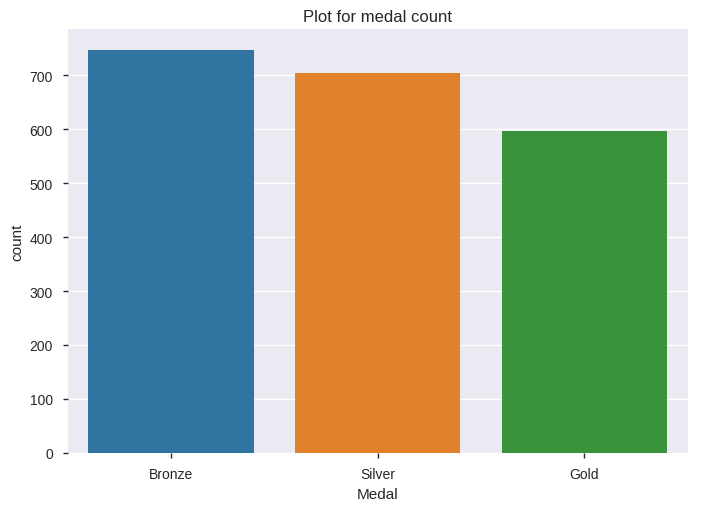

In [0]:
sns.countplot(x='Medal', data=final_df).set_title('Plot for medal count')

Number of Medals
* **Bronze**-750
* **Silver**-Around 700
* **Gold**-Around 600

<a id="section42"></a>
**4.2 Bar chart depicting the top countries**

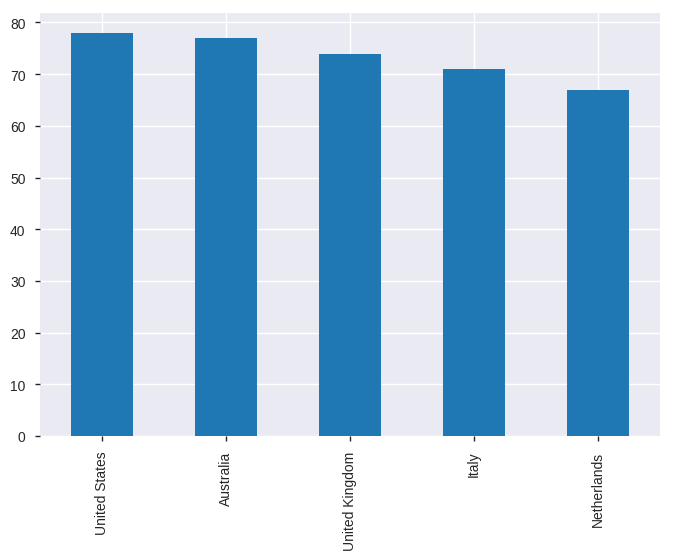

In [0]:
final_df['Country_Name'].value_counts().head().plot.bar(x='Countries',y='Number of Medals')

Medal Ranking 
  * United States -76 medals
  * Australia -75 medals 
  * United Kingdom -73 medals
 
The medal counts are very much close.
  

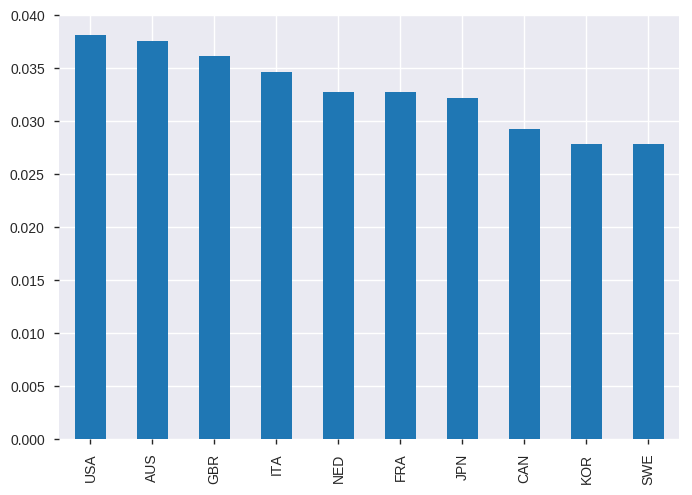

In [0]:
(final_df['Country'].value_counts().head(10) / len(final_df)).plot.bar()

In [0]:
values=final_df['Country'].value_counts().head(10)


In [0]:
top_countries_analysis=final_df[final_df['Country'].isin(values.index)]

In [0]:
top_countries_analysis.GDP_Range.unique()

[High Income, Upper Middle Income, Lower Middle Income]
Categories (3, object): [Lower Middle Income < Upper Middle Income < High Income]

In [0]:
#Retriving the top countries unique values to figure out if the countries have been in the same cateogary from the beginning 
income_df=top_countries_analysis[top_countries_analysis['GDP_Range'].isin(top_countries_analysis.GDP_Range.unique())].drop_duplicates()

In [0]:
income_df2=income_df.drop(['Gender','Medal','Medal_Count','GDP'],axis=1)

In [0]:
income_df2.drop_duplicates(inplace=True)
income_df2.set_index(['Country_Name','Year'])


Country            GDP_Range
Country_Name   Year                             
Australia      1960     AUS          High Income
               1964     AUS          High Income
               1968     AUS          High Income
               1972     AUS          High Income
               1976     AUS          High Income
               1980     AUS          High Income
               1984     AUS          High Income
               1988     AUS          High Income
               1992     AUS          High Income
               1996     AUS          High Income
               2000     AUS          High Income
               2004     AUS          High Income
               2008     AUS          High Income
               2012     AUS          High Income
Canada         1960     CAN          High Income
               1964     CAN          High Income
               1968     CAN          High Income
               1972     CAN          High Income
               1976     CAN          High Income
               1984     CAN          High Income
               1988     CAN          High Income
               1992     CAN          High Income
               1996     CAN          High Income
               2000     CAN          High Income
               2004     CAN          High Income
               2008     CAN          High Income
               2012     CAN          High Income
France         1960     FRA          High Income
               1964     FRA          High Income
               1968     FRA          High Income
               1972     FRA          High Income
               1976     FRA          High Income
               1980     FRA          High Income
               1984     FRA          High Income
               1988     FRA          High Income
               1992     FRA          High Income
               1996     FRA          High Income
               2000     FRA          High Income
               2004     FRA          High Income
               2008     FRA          High Income
               2012     FRA          High Income
United Kingdom 1960     GBR          High Income
               1964     GBR          High Income
               1968     GBR          High Income
               1972     GBR          High Income
               1976     GBR          High Income
               1980     GBR          High Income
               1984     GBR          High Income
               1988     GBR          High Income
               1992     GBR          High Income
               1996     GBR          High Income
               2000     GBR          High Income
               2004     GBR          High Income
               2008     GBR          High Income
               2012     GBR          High Income
Italy          1960     ITA  Upper Middle Income
               1964     ITA          High Income
               1968     ITA          High Income
               1972     ITA          High Income
               1976     ITA          High Income
               1980     ITA          High Income
               1984     ITA          High Income
               1988     ITA          High Income
               1992     ITA          High Income
               1996     ITA          High Income
               2000     ITA          High Income
               2004     ITA          High Income
               2008     ITA          High Income
               2012     ITA          High Income
Japan          1960     JPN  Upper Middle Income
               1964     JPN  Upper Middle Income
               1968     JPN          High Income
               1972     JPN          High Income
               1976     JPN          High Income
               1984     JPN          High Income
               1988     JPN          High Income
               1992     JPN          High Income
               1996     JPN          High Income
               2000     JPN          High Income
               2004     JPN          High Income
  

<b>In the top performing countries </b> 
* Italy,Japan - Has jumped from Upper Middle Income to High Income
* Korea,South - Has jumped from Lower Middle Income to Upper Middle Income to High Income 
* The remaining countries have been in the High Income cateogary form the beginning

<a id="section421"></a>
**4.2.1 Extending Analysis for top countries, with change in economic cateogaries**

**Kenya, South**

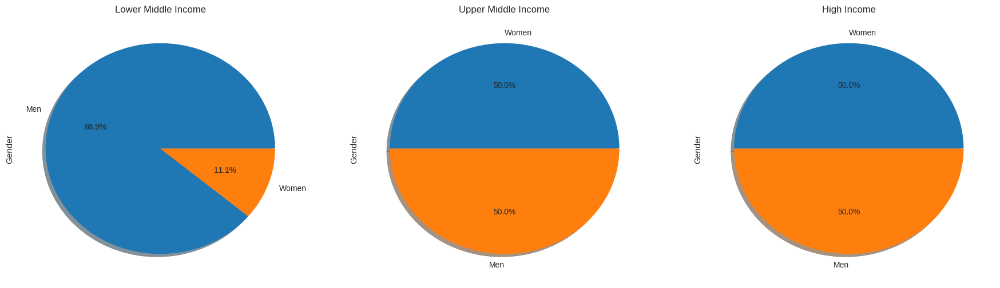

In [0]:
f,ax = plt.subplots(1,3,figsize=(22,6))
income_df['Gender'][income_df['Country_Name']=='Korea, South'][income_df['GDP_Range']=='Lower Middle Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
income_df['Gender'][income_df['Country_Name']=='Korea, South'][income_df['GDP_Range']=='Upper Middle Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True)
income_df['Gender'][income_df['Country_Name']=='Korea, South'][income_df['GDP_Range']=='High Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[2],shadow=True)

ax[0].set_title('Lower Middle Income')
ax[1].set_title('Upper Middle Income')
ax[2].set_title('High Income')

plt.rcParams['font.size'] = 20.0

<b>Its observed that the Women Medal Winners in Kenya,South have drastically increased when its GDP Range Increased</b>

<b>Italy</b>

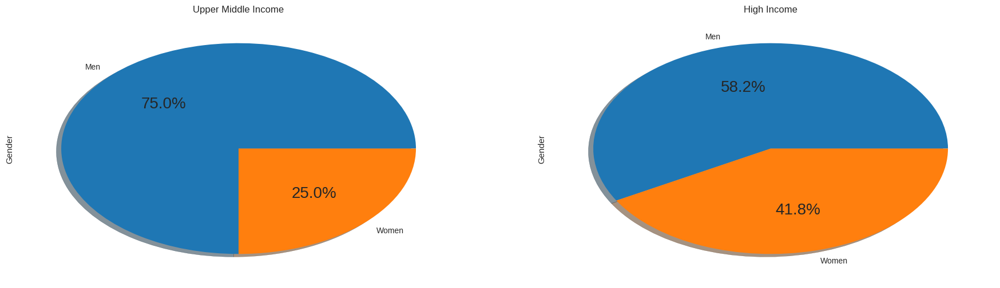

In [0]:
f,ax = plt.subplots(1,2,figsize=(22,6))
income_df['Gender'][income_df['Country_Name']=='Italy'][income_df['GDP_Range']=='Upper Middle Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
income_df['Gender'][income_df['Country_Name']=='Italy'][income_df['GDP_Range']=='High Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True)


ax[0].set_title('Upper Middle Income')
ax[1].set_title('High Income')

plt.rcParams['font.size'] = 20.0

<b>Japan</b>

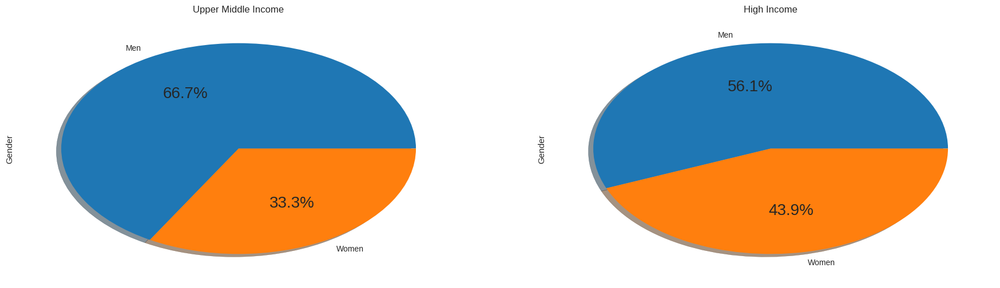

In [0]:
f,ax = plt.subplots(1,2,figsize=(22,6))
income_df['Gender'][income_df['Country_Name']=='Japan'][income_df['GDP_Range']=='Upper Middle Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
income_df['Gender'][income_df['Country_Name']=='Japan'][income_df['GDP_Range']=='High Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True)


ax[0].set_title('Upper Middle Income')
ax[1].set_title('High Income')

plt.rcParams['font.size'] = 20.0

<b>Italy and Japan also depict similar trends of increase in Women medal holders with change in country's economic conditions</b>

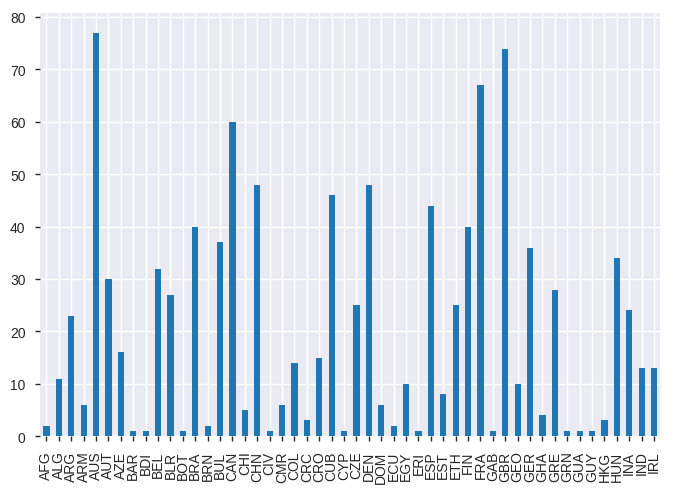

In [0]:
final_df['Country'].value_counts().sort_index().head(50).plot.bar()

<a id="section43"></a>
**4.3 Cateogary-wise pie charts**

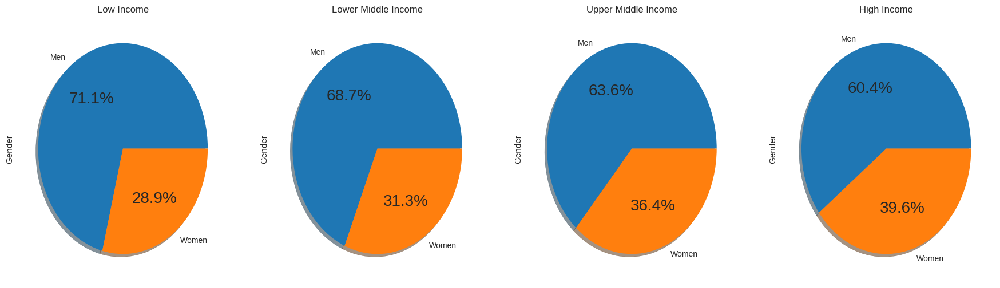

In [0]:
f,ax = plt.subplots(1,4,figsize=(22,6))
final_df['Gender'][final_df['GDP_Range']=='Low Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],shadow=True)
final_df['Gender'][final_df['GDP_Range']=='Lower Middle Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True)
final_df['Gender'][final_df['GDP_Range']=='Upper Middle Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[2],shadow=True)
final_df['Gender'][final_df['GDP_Range']=='High Income'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[3],shadow=True)

ax[0].set_title('Low Income')
ax[1].set_title('Lower Middle Income')
ax[2].set_title('Upper Middle Income')
ax[3].set_title('High Income')

plt.rcParams['font.size'] = 40.0


<b>The percentage of Women winning medals is more in the HIGH INCOME cateogary than all the other cateogaries</b>

<a id="section44"></a>
**4.4 Cateogary-wise Medal count**

Text(0.5,1,'GDP_Range vs Medal_Count')

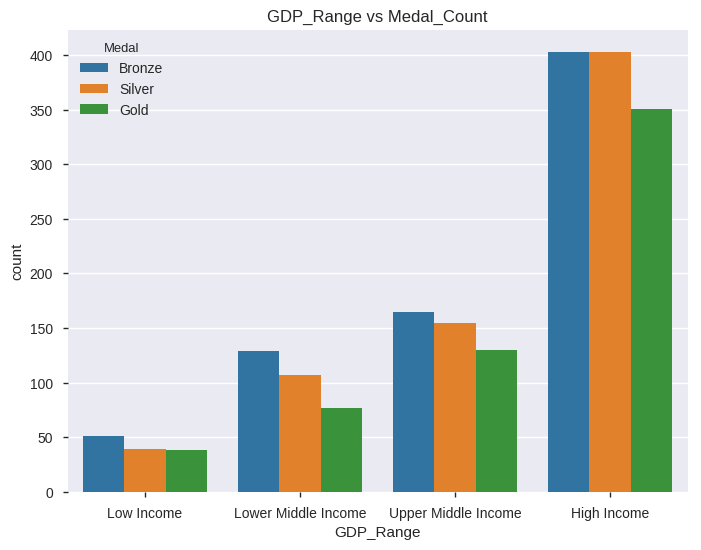

In [0]:
fig,ax =plt.subplots(figsize=(8,6))
sns.countplot(data = final_df,x = 'GDP_Range', hue='Medal')
plt.title('GDP_Range vs Medal_Count')

<b>The count of medals is highest in the HIGH INCOME cateogary than other cateogary</b>

In [0]:
df = pd.DataFrame({'Medal_Count': final_df['Medal_Count'], 'GDP_Range': final_df['GDP_Range']}, dtype='category')         # Create a new dataframe with the two columns and assign numbers in place of their categories
df_num = df.apply(lambda x: x.cat.codes)

In [0]:
df_num.corr()

,GDP_Range,Medal_Count
GDP_Range,1.00000,0.14543
Medal_Count,0.14543,1.00000


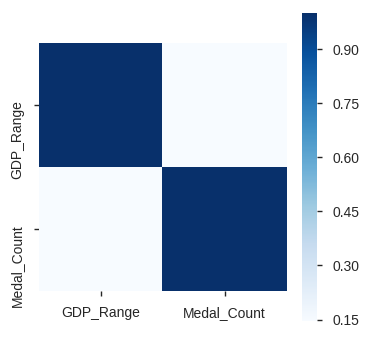

In [0]:
features = df_num.corr()
plt.figure(figsize=(4,4))
sns.heatmap(features,vmax=1,square=True,annot=False,cmap='Blues')
plt.show()

<a id="section5"></a>
**5.Conclusions:**

* GDP Range have impact on a Country's Medal Contribution in Olympics.
* Its observed that Women Medal Contribution has increased with the increase in GDP ie Country economic condition.(Kenya, South; Italy; Japan  portray this). Which implies in Women empowerment
* HIGH INCOME countries have less difference in the net medal counts

<a id="section6"></a>
**6.Actionable Insights:**

* Better Economic analysis and plans can improve a country's GDP which in turn will improve the performance in Olympics and also Women empowerment. 